# Load modules

In [18]:
import warnings
import sys 
if not sys.warnoptions:
    warnings.simplefilter("ignore")
    
import os
import glob
import numpy as np
from numpy.fft import fft, ifft, fftfreq
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import gridspec
from matplotlib.animation import FuncAnimation
import seaborn as sns
from nltools.data import Brain_Data, Adjacency
from nltools.mask import expand_mask, roi_to_brain
from nltools.stats import isc, isfc, isps, fdr, threshold, phase_randomize, circle_shift, _butter_bandpass_filter, _phase_mean_angle, _phase_vector_length
from nilearn.plotting import view_img_on_surf, view_img
from sklearn.metrics import pairwise_distances
from sklearn.utils import check_random_state
from scipy.stats import ttest_1samp
from scipy.signal import hilbert
import networkx as nx
from IPython.display import HTML

base_dir = '/mnt/c/Users/since/Desktop/KdramaApril/'
story_dir = '/mnt/c/Users/since/Dropbox/Lab/Projects/CJY/_DATA'
data_dir = os.path.join(base_dir, 'data', 'derivatives')
denoised_dir = os.path.join(base_dir, 'analysis', 'denoised')
Zdenoised_dir = os.path.join(base_dir, 'analysis', 'denoised_zscore')


spring_dir = '/mnt/c/Users/since/Desktop/KdramaSpring/'
sdata_dir = os.path.join(spring_dir, 'data', 'derivatives')
sZdenoised_dir = os.path.join(spring_dir, 'analysis', 'denoised_zscore')

## Load mask

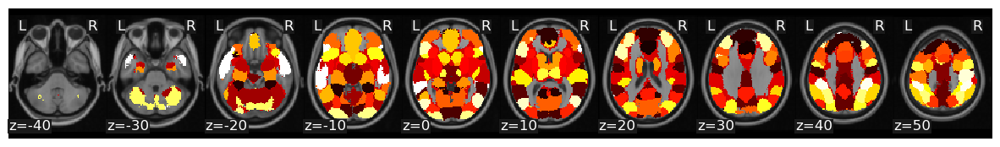

In [144]:
from nltools.mask import expand_mask
mask = Brain_Data('http://neurovault.org/media/images/2099/Neurosynth%20Parcellation_0.nii.gz')
mask_x = expand_mask(mask)

#mask = Brain_Data(os.path.join(base_dir,'analysis', 'Masks', 'k50_2mm.nii.gz'))
#mask_x = expand_mask(mask)

mask.plot()

In [6]:
rois = pd.read_csv('https://raw.githubusercontent.com/naturalistic-data-analysis/tutorial_development/master/hypertools/rois.csv', header=None, names=['ID', 'Region'])
rois

,ID,Region
0,0,Anterior MPFC
1,1,Fusiform/parahippocampus
2,2,DMPFC
3,3,Sensorimotor/postcentral gyrus
4,4,V1
5,5,TPJ posterior supra marginal/angular gyrus
6,6,PCC/precuneus
7,7,Thalamus
8,8,SMA
9,9,Precentral gyrus


# Trimming StoryTimeseries

In [77]:
import scipy.io as sio
#for sub in subjects: 

all_story = {}
subjects = ['1', '2', '3', '4']
for sub in subjects:
    mat = sio.loadmat(glob.glob(os.path.join(story_dir, 'fMRItdsgn', f'sub-{sub}_*.mat'))[0])
    story = []
    for i in np.arange(0,8):
        temp = mat['subj'][0][0][5][0][i][0]
        story = np.append(story, temp)
    all_story[sub] = story
all_story

subjects = ['5', '6']
for sub in subjects:
    mat = sio.loadmat(glob.glob(os.path.join('/mnt/c/Users/since/Dropbox/Lab/Projects/CJY/_DATA/spring', f'sub-0{sub}_task-recall_countered-*_stimulusCond-*_*.mat'))[0])
    story = ['Neighbors']
    for i in np.arange(0,4):
        temp_story = mat['data'][0][0][7][0][i][0]
        story = np.append(story, temp_story)
    all_story[sub] = story
    
# sub-08 
mat = sio.loadmat(glob.glob(os.path.join('/mnt/c/Users/since/Dropbox/Lab/Projects/CJY/_DATA/spring', 'sub-102_task-recall_counter-*_session-01_cond-1_clock-*.mat'))[0])
story2 = ['Dream']
for i in np.arange(0,6):
    stroy2 = mat['data'][0][0][8][0][i]
    story2 = np.append(story2, stroy2)
#All_story
story2 = np.insert(story2, 4, 'King')
all_story['8'] = story2

all_story['2'] = np.delete(all_story['2'], (4,5,6,7))
all_story

{'1': array(['Dream', 'BlindDate', 'TwoBoys', 'BusinessLunch', 'King',
        'WayToSchool', 'Neighbors', 'RunningMan'], dtype='<U32'),
 '2': array(['King', 'TwoBoys', 'BusinessLunch', 'RunningMan'], dtype='<U32'),
 '3': array(['Dream', 'Neighbors', 'TwoBoys', 'BusinessLunch', 'King',
        'WayToSchool', 'BlindDate', 'RunningMan'], dtype='<U32'),
 '4': array(['Dream', 'BlindDate', 'RunningMan', 'BusinessLunch', 'King',
        'WayToSchool', 'Neighbors', 'TwoBoys'], dtype='<U32'),
 '5': array(['Neighbors', 'Runningman', 'First Date', 'Way To School',
        'Business Lunch'], dtype='<U14'),
 '6': array(['Neighbors', 'Runningman', 'Business Lunch', 'Way To School',
        'First Date'], dtype='<U14'),
 '8': array(['Dream', 'Blind Date', 'Way To School', 'Business Lunch', 'King',
        'Runningman', 'neighbors', 'TwoBoys'], dtype='<U14')}

In [82]:
all_story['8'][1] = 'BlindDate'
all_story['8'][2] = 'WayToSchool'
all_story['8'][3] = 'BusinessLunch'
all_story['8'][5] = 'RunningMan'
all_story['8'][6] = 'Neighbors'

all_story

{'1': array(['Dream', 'BlindDate', 'TwoBoys', 'BusinessLunch', 'King',
        'WayToSchool', 'Neighbors', 'RunningMan'], dtype='<U32'),
 '2': array(['King', 'TwoBoys', 'BusinessLunch', 'RunningMan'], dtype='<U32'),
 '3': array(['Dream', 'Neighbors', 'TwoBoys', 'BusinessLunch', 'King',
        'WayToSchool', 'BlindDate', 'RunningMan'], dtype='<U32'),
 '4': array(['Dream', 'BlindDate', 'RunningMan', 'BusinessLunch', 'King',
        'WayToSchool', 'Neighbors', 'TwoBoys'], dtype='<U32'),
 '5': array(['Neighbors', 'Runningman', 'First Date', 'Way To School',
        'Business Lunch'], dtype='<U14'),
 '6': array(['Neighbors', 'Runningman', 'Business Lunch', 'Way To School',
        'First Date'], dtype='<U14'),
 '8': array(['Dream', 'BlindDate', 'WayToSchool', 'BusinessLunch', 'King',
        'RunningMan', 'Neighbors', 'TwoBoys'], dtype='<U14')}

In [116]:
# Onset & offset -- setsize 6 일 경우 

onset = [11, 121, 241, 361] 
offset = [126, 236, 356, 476]  

sub_story_timeseries = {}
for sub in ['1','3', '4']:
    story = {}
    data = pd.read_csv(os.path.join(Zdenoised_dir,'averaged_ROIs', f'sub-0{sub}_task-encoding_run-1_Average_ROI_n50.csv'))
    data2 = pd.read_csv(os.path.join(Zdenoised_dir,'averaged_ROIs', f'sub-0{sub}_task-encoding_run-2_Average_ROI_n50.csv'))
    data3 = pd.read_csv(os.path.join(Zdenoised_dir,'averaged_ROIs', f'sub-0{sub}_task-encoding_run-3_Average_ROI_n50.csv'))
    data4 = pd.read_csv(os.path.join(Zdenoised_dir,'averaged_ROIs', f'sub-0{sub}_task-encoding_run-4_Average_ROI_n50.csv'))
    
    for i in np.arange(0,4):
        name1 = all_story[sub][i] 
        name2 = all_story[sub][i+4] 
        story[name1] = {'visual' : data[onset[i]:offset[i]], 'audio' : data2[onset[i]:offset[i]]}
        story[name2] =  {'visual' : data3[onset[i]:offset[i]], 'audio' : data4[onset[i]:offset[i]]}

    sub_story_timeseries[sub] = story

for sub in ['8']:
    story = {}
    data = pd.read_csv(os.path.join(sZdenoised_dir,'Averaged_ROI', f'sub-0{sub}_run-1_Average_ROI_n50.csv'))
    data2 = pd.read_csv(os.path.join(sZdenoised_dir,'Averaged_ROI', f'sub-0{sub}_run-2_Average_ROI_n50.csv')) 
    data3 = pd.read_csv(os.path.join(sZdenoised_dir,'Averaged_ROI', f'sub-0{sub}_run-3_Average_ROI_n50.csv'))
    data4 = pd.read_csv(os.path.join(sZdenoised_dir,'Averaged_ROI', f'sub-0{sub}_run-4_Average_ROI_n50.csv')) 
    
    for i in np.arange(0,4):
        name1 = all_story[sub][i] 
        name2 = all_story[sub][i+4] 
        story[name1] = {'visual' : data[onset[i]:offset[i]], 'audio' : data2[onset[i]:offset[i]]}
        story[name2] =  {'visual' : data3[onset[i]:offset[i]], 'audio' : data4[onset[i]:offset[i]]}
        
    sub_story_timeseries[sub] = pd.DataFrame(story)

# Select ROIs

In [121]:
ROIs = {}
# for roi in [5, 28, 32]:
# for roi in [1, 4, 5, 6, 15, 19, 27, 28, 32, 45]:
for roi in np.arange(50):
    sub_rois = {}
    for sub in ['1', '3', '4', '8']:
        story_roi = {}
        for j in all_story['1']:
            story_timeseries = sub_story_timeseries[sub][j]
            run_rois = {}
            for run in ['visual', 'audio']:
                run_rois[run]  = story_timeseries[run].iloc[:, roi]
            story_roi[j] = pd.DataFrame(run_rois).reset_index(drop=True)
        sub_rois[sub] = story_roi
    ROIs[roi] = sub_rois

In [122]:
sub_rois['8']['TwoBoys']

,visual,audio
0,-0.435115,3.185405e-13
1,-2.063240,-7.885026e-01
2,-1.374192,2.735884e-13
3,-0.584296,-3.442517e-13
4,-1.221129,-5.813094e-13
...,...,...
110,0.227772,-2.139294e+00
111,0.263556,-7.993465e-13
112,-0.007756,-2.239113e-13
113,0.627865,-9.688563e-13


# ISC for visaul, audio encoding 

In [151]:
from tqdm import tqdm

isc_visual_r, isc_visual_p = {}, {}
isc_audio_r, isc_audio_p = {}, {}
isc_encoding_r, isc_encoding_p = {}, {}

for roi in tqdm(range(50)):
    visual_data = {}
    audio_data = {}
    data = {} 
    
    visual_stats = {}
    audio_stats = {}
    stats = {}
    
    v_story_isc_r, v_story_isc_p = {}, {}
    a_story_isc_r, a_story_isc_p = {}, {}
    story_isc_r, story_isc_p = {}, {} 
    
    for j, story in enumerate(all_story['1']):
        sub_visual_data = {}
        sub_audio_data = {}
        sub_data = {}
        
        for sub in ['1', '3', '4', '8']:
            sub_visual_data[sub] = ROIs[roi][sub][story]['visual']
            sub_audio_data[sub] = ROIs[roi][sub][story]['audio']
            sub_data[sub] = sub_visual_data[sub].append(sub_audio_data[sub])
            sub_data[sub].reset_index(inplace=True, drop=True)
        
        visual_data[j] = sub_visual_data
        audio_data[j] = sub_audio_data
        data[j] = sub_data
        
        visual_stats[j] = isc(pd.DataFrame(visual_data[j]), n_bootstraps=5000, metric='median', method='bootstrap')
        audio_stats[j] = isc(pd.DataFrame(audio_data[j]), n_bootstraps=5000, metric='median', method='bootstrap')
        stats[j] = isc(pd.DataFrame(data[j]), n_bootstraps=5000, metric='median', method='bootstrap')
        
        v_story_isc_r[j], v_story_isc_p[j] = visual_stats[j]['isc'], visual_stats[j]['p']
        a_story_isc_r[j], a_story_isc_p[j] = audio_stats[j]['isc'], audio_stats[j]['p']
        story_isc_r[j], story_isc_p[j] = stats[j]['isc'], stats[j]['p']
        
    isc_visual_r[roi], isc_visual_p[roi] = v_story_isc_r, v_story_isc_p
    isc_audio_r[roi], isc_audio_p[roi] = a_story_isc_r, a_story_isc_p
    isc_encoding_r[roi], isc_encoding_p[roi] = story_isc_r, story_isc_p

100%|███████████████████████████████████████████████████████████████████████████████████| 50/50 [12:29<00:00, 15.00s/it]


In [276]:
visual_data[j]

{'1': 0      2.509008
 1     -0.387035
 2     -0.864382
 3     -1.459763
 4     -0.721026
          ...   
 110    0.340644
 111    0.445538
 112    1.441424
 113    1.004312
 114    0.479571
 Name: visual, Length: 115, dtype: float64,
 '3': 0      0.594407
 1      2.124746
 2      1.531461
 3      1.306485
 4      0.537575
          ...   
 110   -2.084193
 111   -1.110891
 112   -0.046196
 113    0.689242
 114    0.511048
 Name: visual, Length: 115, dtype: float64,
 '4': 0      1.829638e+00
 1     -4.778556e-13
 2     -3.301014e-13
 3     -6.805971e-01
 4     -2.623016e-01
            ...     
 110    2.927288e-01
 111    1.086667e+00
 112    8.801093e-01
 113    2.998200e-01
 114    2.162873e-01
 Name: visual, Length: 115, dtype: float64,
 '8': 0     -0.224013
 1     -0.366951
 2     -0.266562
 3      0.061978
 4     -0.024650
          ...   
 110    0.201296
 111    0.023563
 112   -1.035362
 113   -1.252510
 114   -0.776402
 Name: visual, Length: 115, dtype: float64}

# plotting pd.Series(eISC_r)

In [129]:
#from nilearn import image as img
from nilearn import plotting as plot
from nilearn.plotting import view_img_on_surf, view_img

In [152]:
eISC_r, eISC_p = {}, {}
vISC_r, vISC_p = {}, {}
aISC_r, aISC_p = {}, {}
eISC_r_brain, eISC_p_brain = {}, {}
vISC_r_brain, vISC_p_brain = {}, {}
aISC_r_brain, aISC_p_brain = {}, {}

for j in tqdm(range(8)):
    eeISC_r, eeISC_p = {}, {}
    vvISC_r, vvISC_p = {}, {}
    aaISC_r, aaISC_p = {}, {}
    
    for roi in range(50):
        eeISC_r[roi], eeISC_p[roi] = isc_encoding_r[roi][j], isc_encoding_p[roi][j]
        vvISC_r[roi], vvISC_p[roi] = isc_visual_r[roi][j], isc_visual_p[roi][j]
        aaISC_r[roi], aaISC_p[roi] = isc_audio_r[roi][j], isc_audio_p[roi][j]
        
    eISC_r[j], eISC_p[j] = eeISC_r, eeISC_p
    vISC_r[j], vISC_p[j] = vvISC_r, vvISC_p
    aISC_r[j], aISC_p[j] = aaISC_r, aaISC_p
    
    eISC_r_brain[j], eISC_p_brain[j] = roi_to_brain(pd.Series(eISC_r[j]), mask_x), roi_to_brain(pd.Series(eISC_p[j]), mask_x)
    vISC_r_brain[j], vISC_p_brain[j] = roi_to_brain(pd.Series(vISC_r[j]), mask_x), roi_to_brain(pd.Series(vISC_p[j]), mask_x)
    aISC_r_brain[j], aISC_p_brain[j] = roi_to_brain(pd.Series(aISC_r[j]), mask_x), roi_to_brain(pd.Series(aISC_p[j]), mask_x)

100%|█████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  5.65it/s]


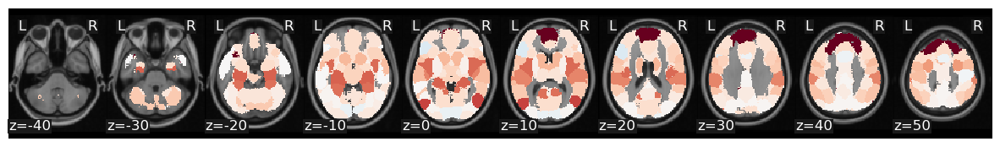

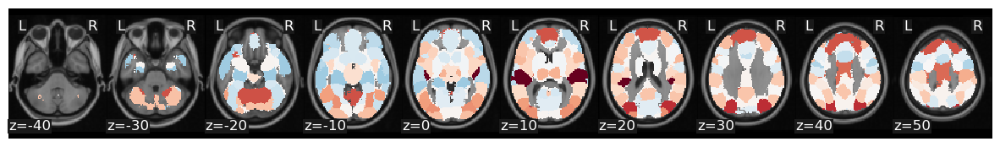

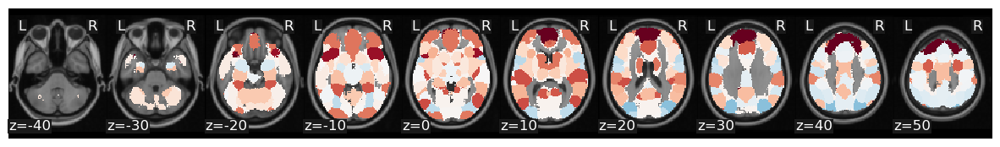

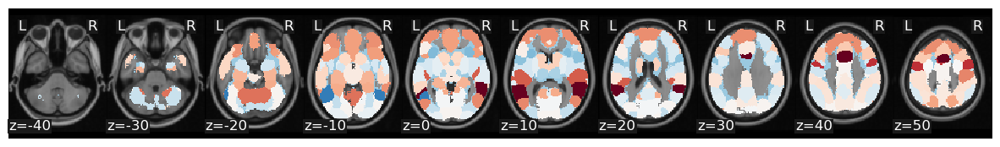

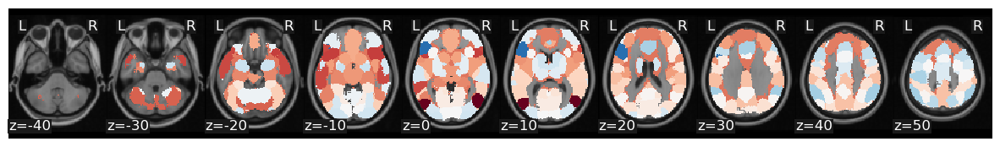

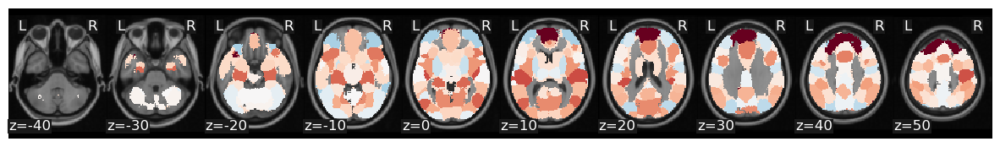

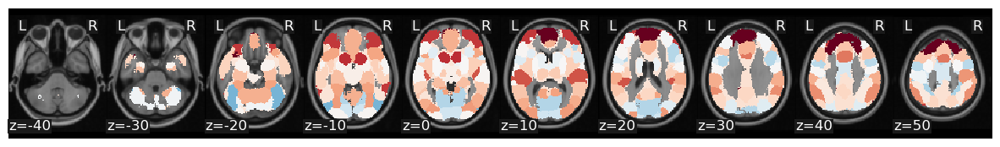

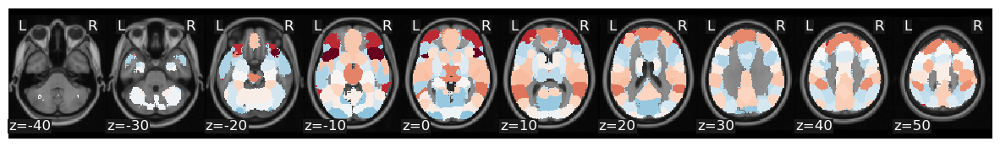

In [130]:
for j in range(8):
    eISC_r_brain[j].plot(cmap='RdBu_r')


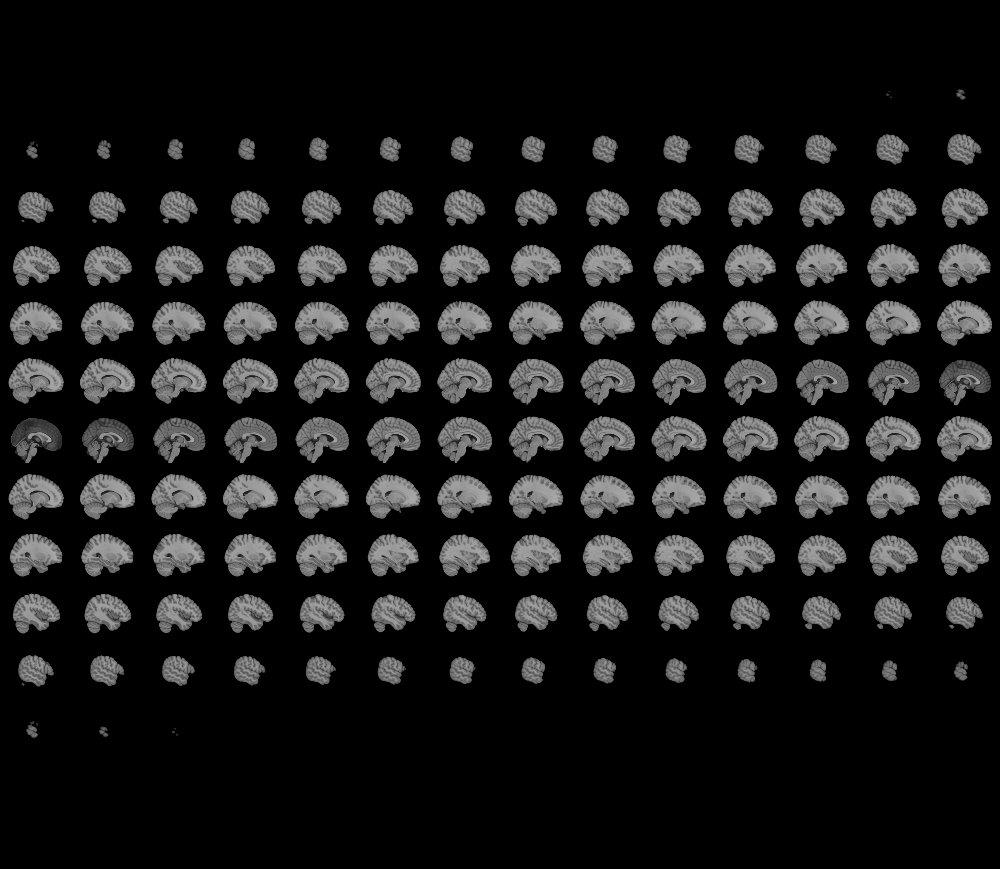
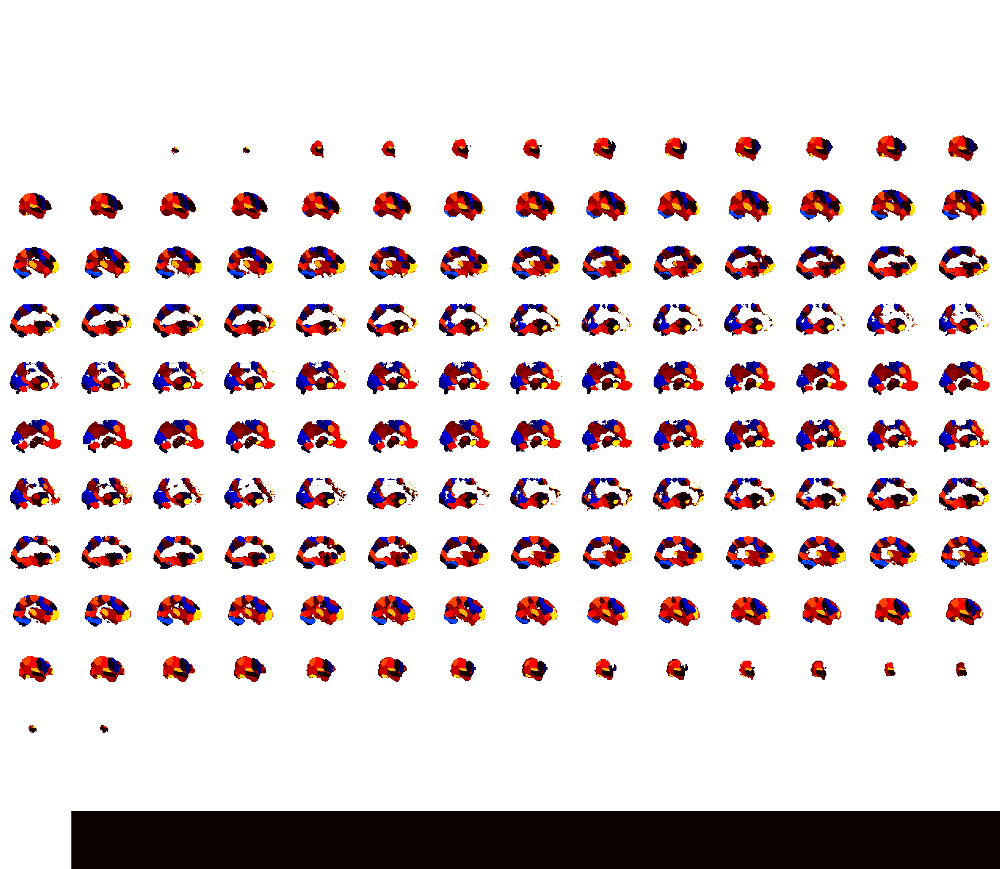

In [138]:
#['Dream', 'BlindDate', 'TwoBoys', 'BusinessLunch', 'King','WayToSchool', 'Neighbors', 'RunningMan']
view_img(eISC_r_brain[6].to_nifti(), draw_cross = False)

In [135]:
#view_img_on_surf(threshold(isc_Visaul_r_brain, isc__visual_p_brain, thr=.001).to_nifti())
view_img_on_surf(threshold(eISC_r_brain, eISC_p_brain, thr=fdr(eISC_p_brain.data)).to_nifti())

AttributeError: 'dict' object has no attribute 'data'

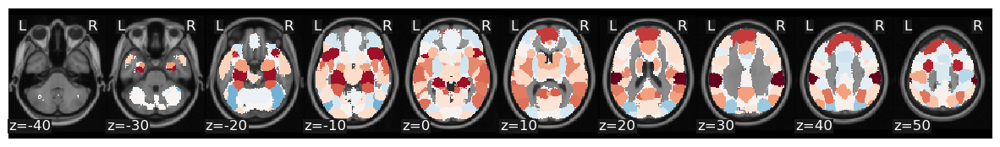

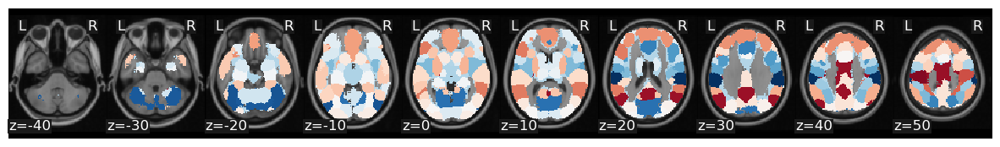

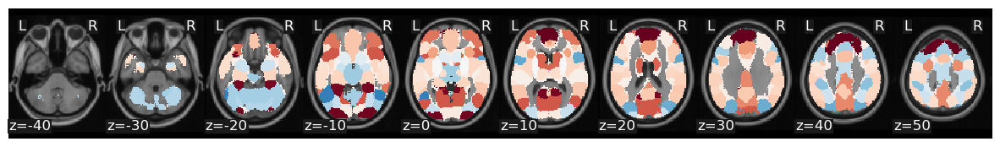

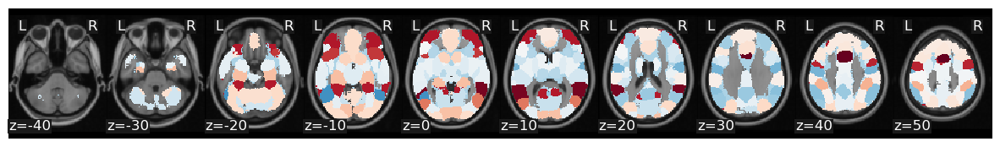

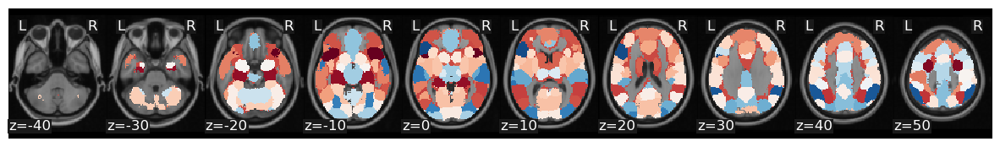

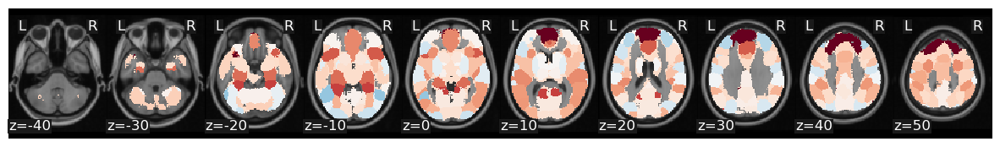

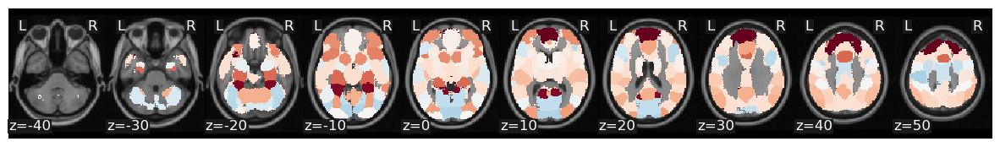

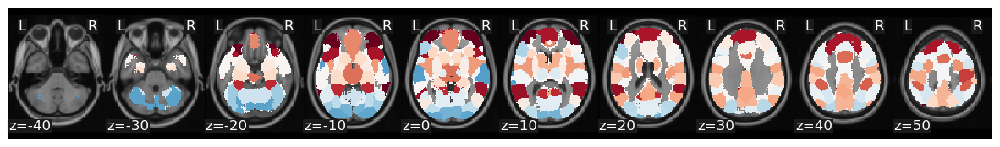

In [139]:
for j in range(8):
    vISC_r_brain[j].plot(cmap='RdBu_r')

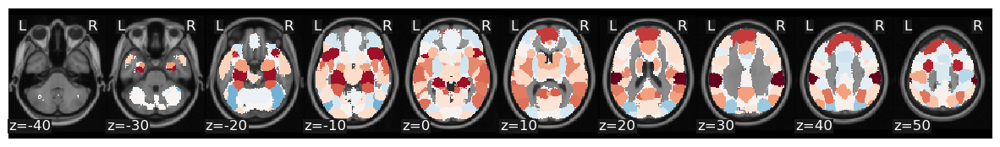

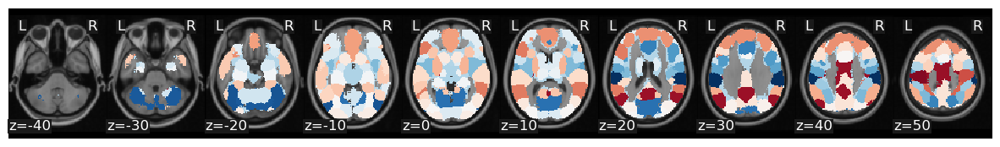

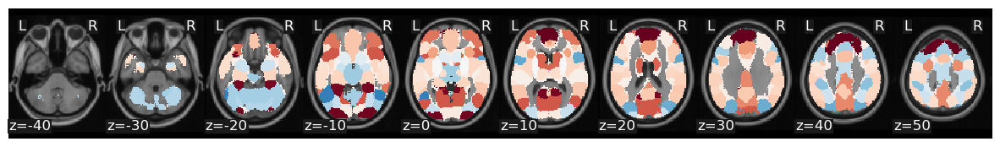

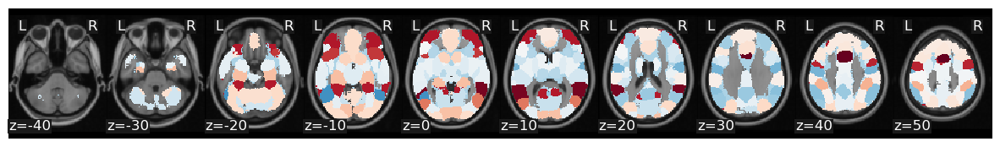

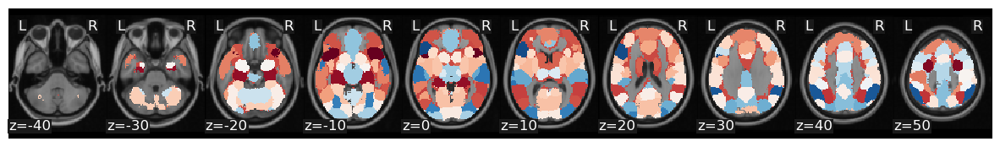

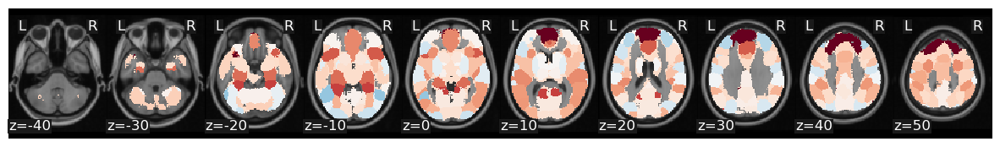

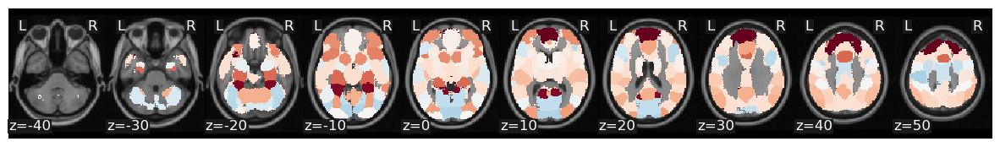

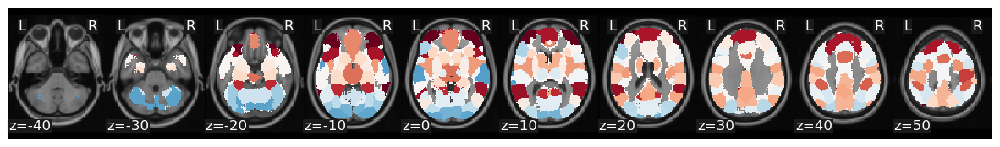

In [141]:
for j in range(8):
    aISC_r_brain[j].plot(cmap='RdBu_r')


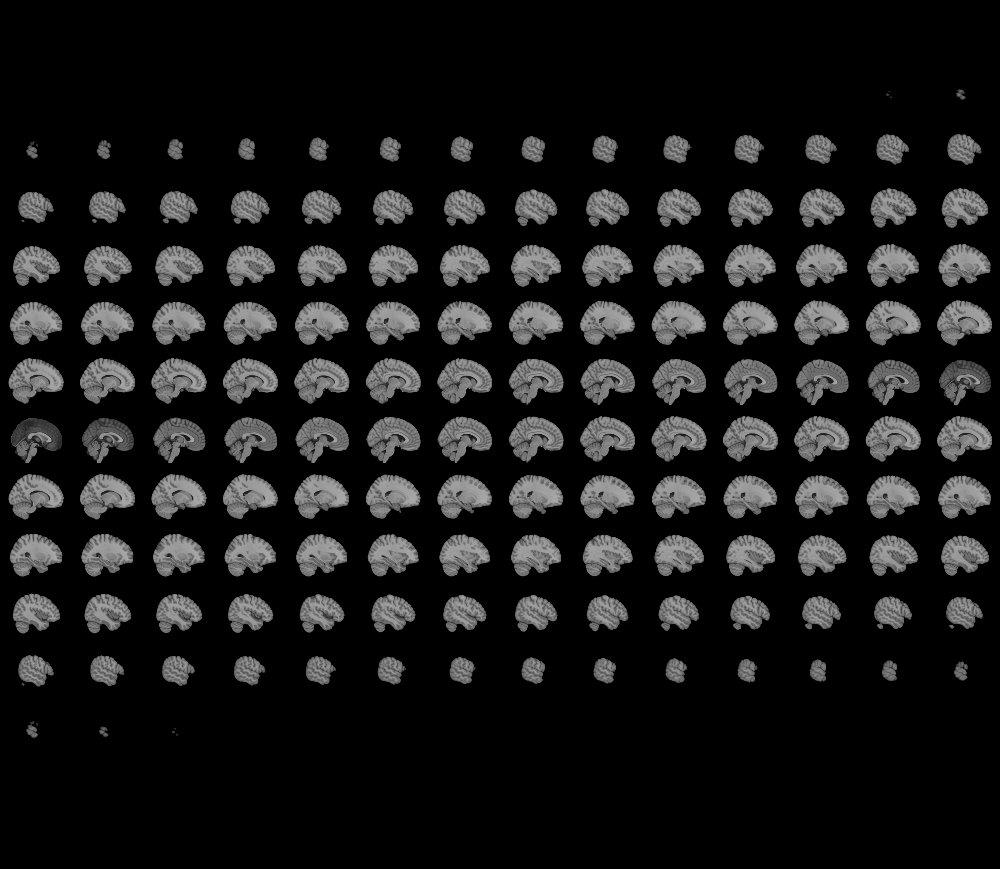
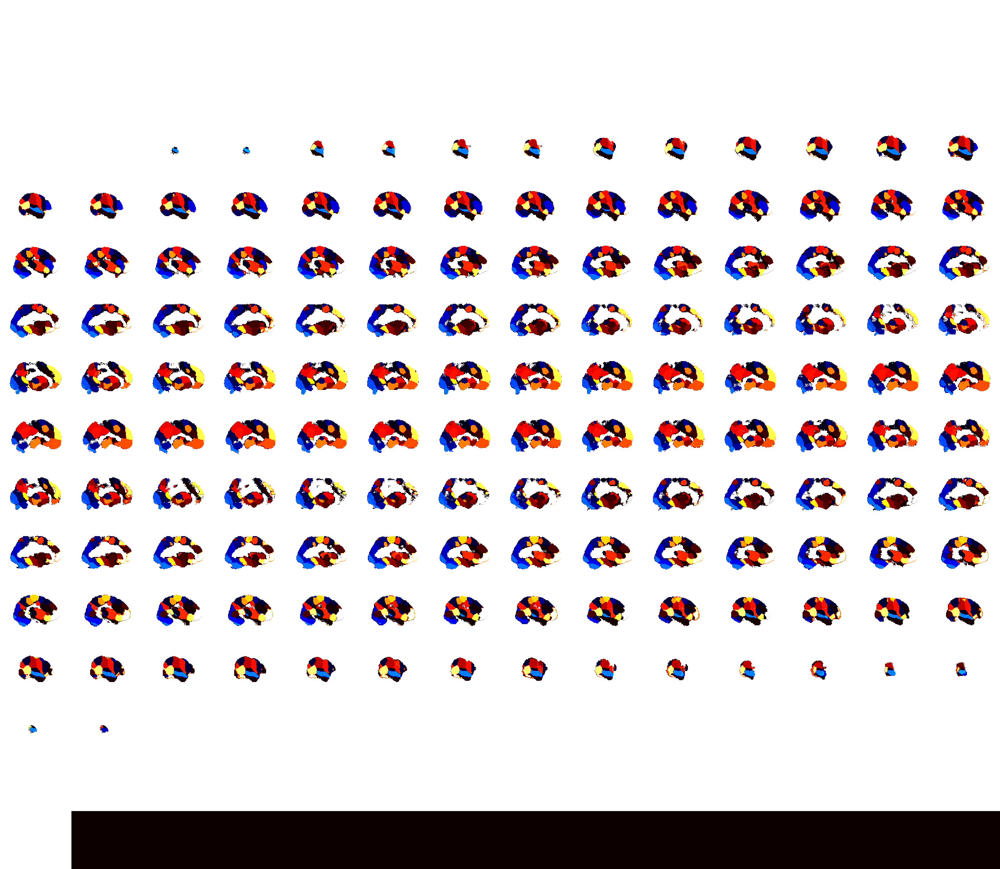

In [299]:
#['Dream', 'BlindDate', 'TwoBoys', 'BusinessLunch', 'King','WayToSchool', 'Neighbors', 'RunningMan']
num = 7
#vISC_r_brain[num].plot(cmap='RdBu_r')
view_img(vISC_r_brain[num].to_nifti())
#view_img(threshold(vISC_r_brain[num], vISC_p_brain[num], thr=.05).to_nifti())

In [63]:
#view_img_on_surf(threshold(isc_Visaul_r_brain, isc__visual_p_brain, thr=.001).to_nifti())
view_img_on_surf(threshold(vISC_r_brain, vISC_p_brain, thr=fdr(vISC_p_brain.data)).to_nifti())

{0: 0.004999000199960008,
 1: 0.7408518296340731,
 2: 0.7408518296340731,
 3: 0.22095580883823235,
 4: 0.21135772845430914,
 5: 0.7408518296340731,
 6: 0.9808038392321535,
 7: 0.9808038392321535,
 8: 0.6016796640671865,
 9: 0.9808038392321535,
 10: 0.17296540691861628,
 11: 0.3169366126774645,
 12: 0.9808038392321535,
 13: 0.0001999600079984003,
 14: 0.9808038392321535,
 15: 0.9808038392321535,
 16: 0.9808038392321535,
 17: 0.5680863827234554,
 18: 0.0625874825034993,
 19: 0.9808038392321535,
 20: 0.9808038392321535,
 21: 0.9808038392321535,
 22: 0.16816636672665466,
 23: 0.3217356528694261,
 24: 0.04819036192761448,
 25: 0.9808038392321535,
 26: 0.29774045190961806,
 27: 0.2881423715256949,
 28: 0.2401519696060788,
 29: 0.34573085382923413,
 30: 0.9808038392321535,
 31: 0.17776444711057787,
 32: 0.9808038392321535,
 33: 0.9808038392321535,
 34: 0.9808038392321535,
 35: 0.23055388922215556,
 36: 0.22095580883823235,
 37: 0.3889222155568886,
 38: 0.9808038392321535,
 39: 0.9808038392321


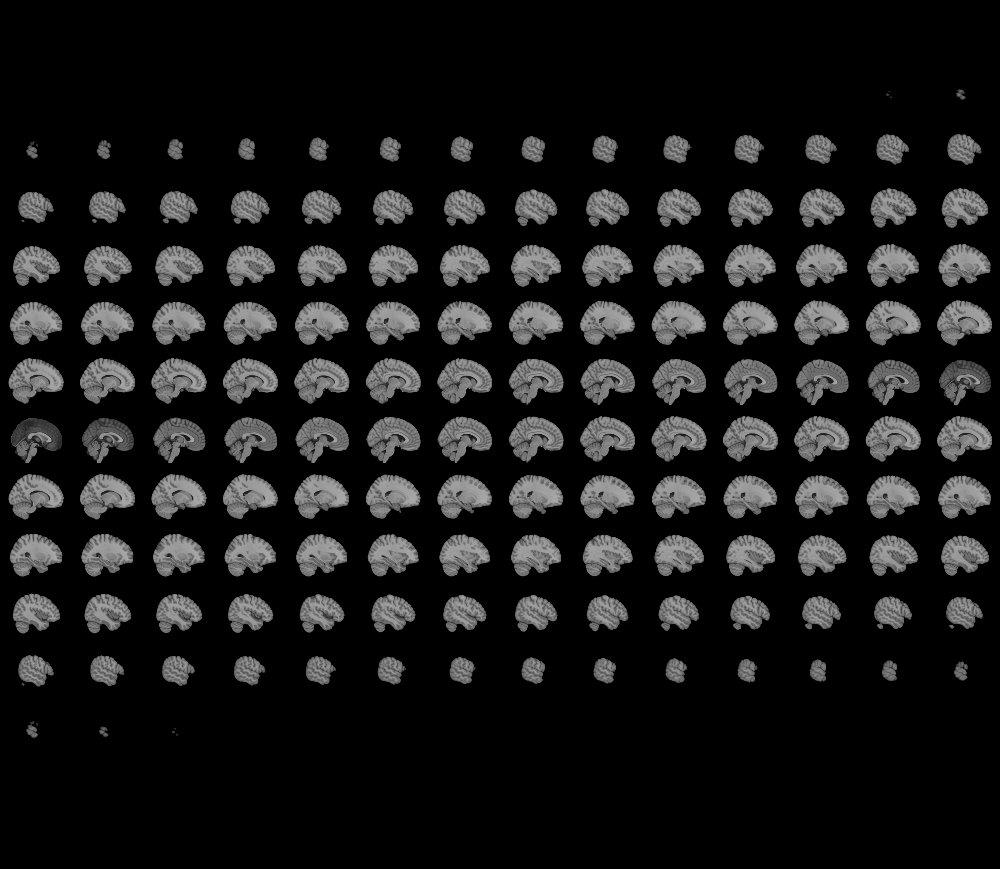
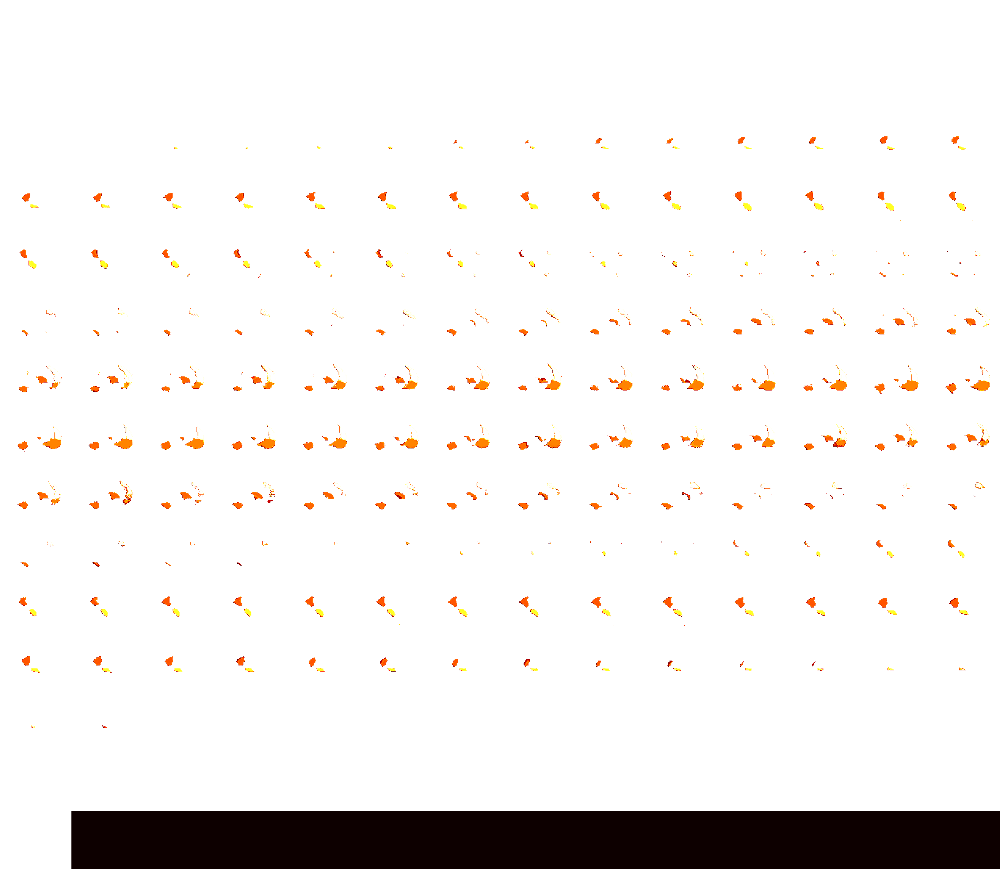

In [287]:
#['Dream', 'BlindDate', 'TwoBoys', 'BusinessLunch', 'King','WayToSchool', 'Neighbors', 'RunningMan']
num = 0
view_img(threshold(aISC_r_brain[num], aISC_p_brain[num], thr=0.001).to_nifti())


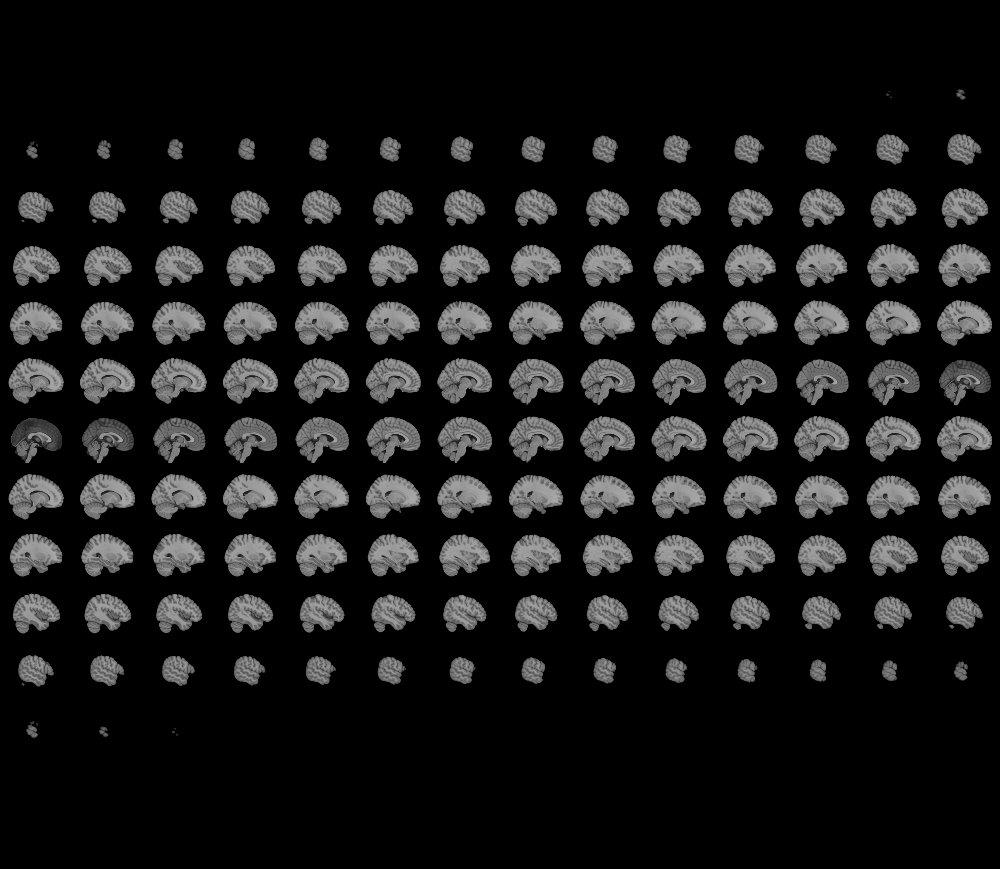
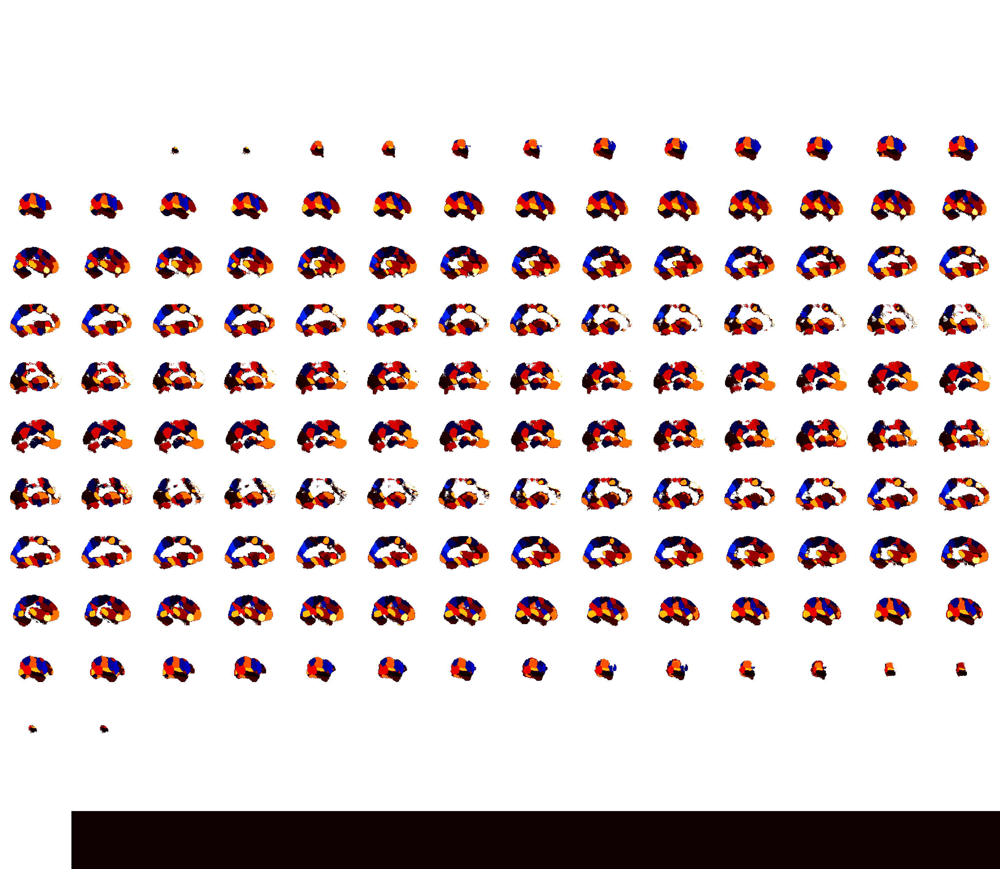

In [310]:
#['Dream', 'BlindDate', 'TwoBoys', 'BusinessLunch', 'King','WayToSchool', 'Neighbors', 'RunningMan']
num = 2
#eISC_r_brain[num].plot(cmap='RdBu_r')
view_img(eISC_r_brain[num].to_nifti())
#view_img(threshold(eISC_r_brain[num], eISC_p_brain[num], thr=fdr(eISC_p_brain[num].data)).to_nifti())
#view_img(threshold(eISC_r_brain[num], eISC_p_brain[num], thr=0.08).to_nifti())